In [61]:
import os
from pathlib import Path
import json

In [62]:
experiment_id = "10_February_2025_12:59:53_BasicClubConvergence_7"
exp_path = Path(os.getcwd(), experiment_id)
files = os.listdir(exp_path)
retrains = [file for file in files if "retrain" in file]
source = [file for file in files if "retrain" not in file][0]
with open(Path(exp_path, source), 'r') as f:
    source_data = json.load(f)
target_logs = {}
for file in retrains:
    agent_id = int(file.split("_")[1].replace(".json",""))
    with open(Path(exp_path, file), 'r') as f:
        target_data = json.load(f)
    target_logs[agent_id] = target_data

# for agent_id in target_logs.keys():
#     retrained_data = target_logs[agent_id]
#     reward_retrain = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in retrained_data]
#     reward_source = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

#     mitigation_retrain = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in retrained_data]
#     mitigation_source = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

#     savings_retrain = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in retrained_data]
#     savings_source = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

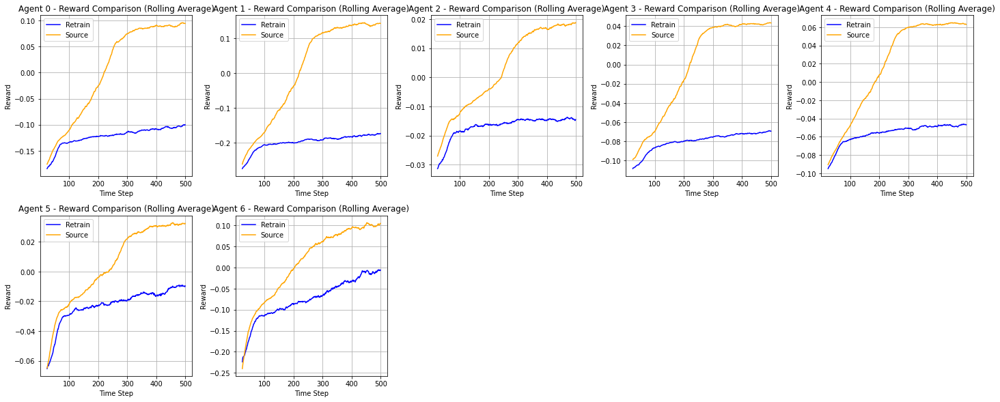

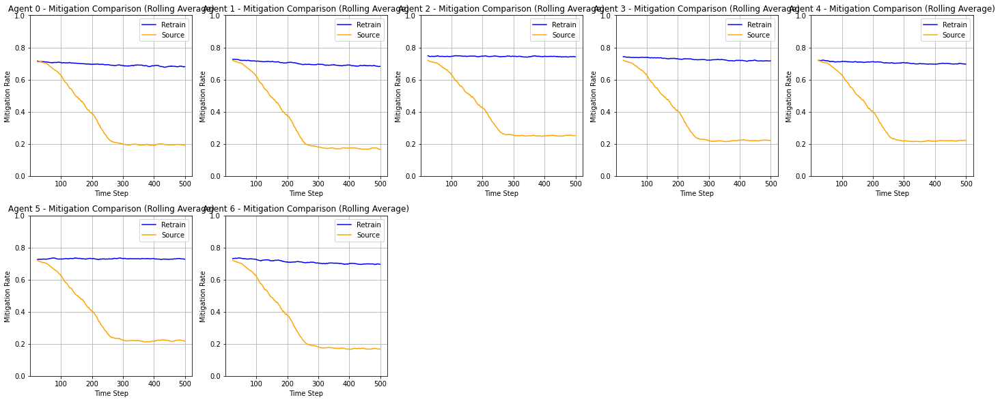

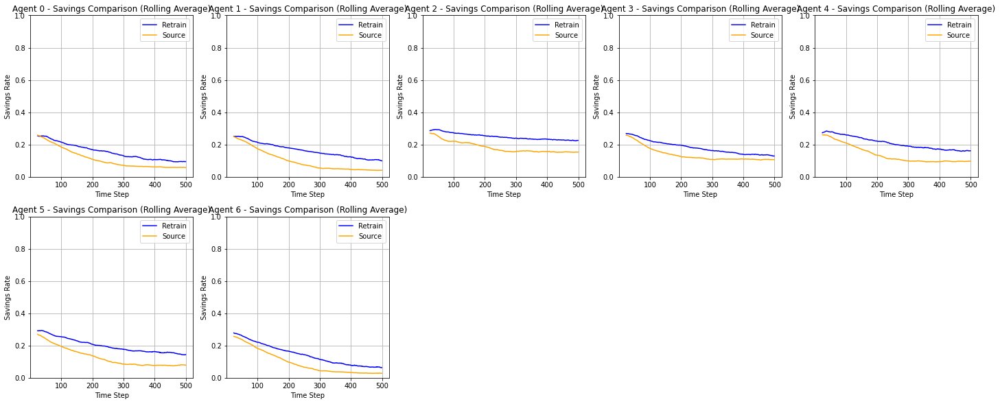

In [63]:
import os
import json
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path

# Load the data
experiment_id = "10_February_2025_12:59:53_BasicClubConvergence_7"
exp_path = Path(os.getcwd(), experiment_id)
files = os.listdir(exp_path)

# Separate retrain and source files
retrains = [file for file in files if "retrain" in file]
source = [file for file in files if "retrain" not in file][0]

# Load source data
with open(Path(exp_path, source), 'r') as f:
    source_data = json.load(f)

# Load target (retrained) data
target_logs = {}
for file in retrains:
    agent_id = int(file.split("_")[1].replace(".json", ""))
    with open(Path(exp_path, file), 'r') as f:
        target_data = json.load(f)
    target_logs[agent_id] = target_data

# Define the window size for rolling average
window_size = 25  

# Define metrics to plot
metrics = ['reward', 'mitigation', 'savings']

# Create a figure for each metric
for metric in metrics:
    # Create a figure with a 4x5 grid of subplots
    fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(20, 16))  # Adjust figsize as needed
    axs = axs.flatten()  # Flatten the 2D array of axes to easily index them

    # Iterate through each agent and plot their data
    for idx, agent_id in enumerate(target_logs.keys()):
        retrained_data = target_logs[agent_id]
        
        # Extract and process data based on the current metric
        if metric == 'reward':
            retrain_data = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in retrained_data]
            source_data_ = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in source_data][:len(retrain_data)]
            ylabel = 'Reward'
        elif metric == 'mitigation':
            retrain_data = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in retrained_data]
            source_data_ = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in source_data][:len(retrain_data)]
            ylabel = 'Mitigation Rate'
        elif metric == 'savings':
            retrain_data = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in retrained_data]
            source_data_ = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in source_data][:len(retrain_data)]
            ylabel = 'Savings Rate'
        
        # Convert to pandas Series for rolling average
        retrain_series = pd.Series(retrain_data).rolling(window=window_size).mean()
        source_series = pd.Series(source_data_).rolling(window=window_size).mean()

        # Create a square plot for each agent
        axs[idx].plot(retrain_series, label='Retrain', color='blue')
        axs[idx].plot(source_series, label='Source', color='orange')
        axs[idx].set_title(f'Agent {agent_id} - {metric.capitalize()} Comparison (Rolling Average)')
        axs[idx].set_xlabel('Time Step')
        axs[idx].set_ylabel(ylabel)
        axs[idx].legend()
        axs[idx].grid()

        # Set y-axis limits for mitigation and savings
        if metric in ['mitigation', 'savings']:
            axs[idx].set_ylim(0, 1)

    # Remove any empty subplots if there are fewer agents than subplots
    for j in range(len(target_logs), len(axs)):
        fig.delaxes(axs[j])

    # Adjust layout
    plt.tight_layout()

    # Create plots directory if it does not exist
    plots_dir = Path(exp_path, "plots")
    os.makedirs(plots_dir, exist_ok=True)

    # Save the figure for the current metric
    plt.savefig(plots_dir / f'{metric}_comparison_grid.png')
    plt.show()


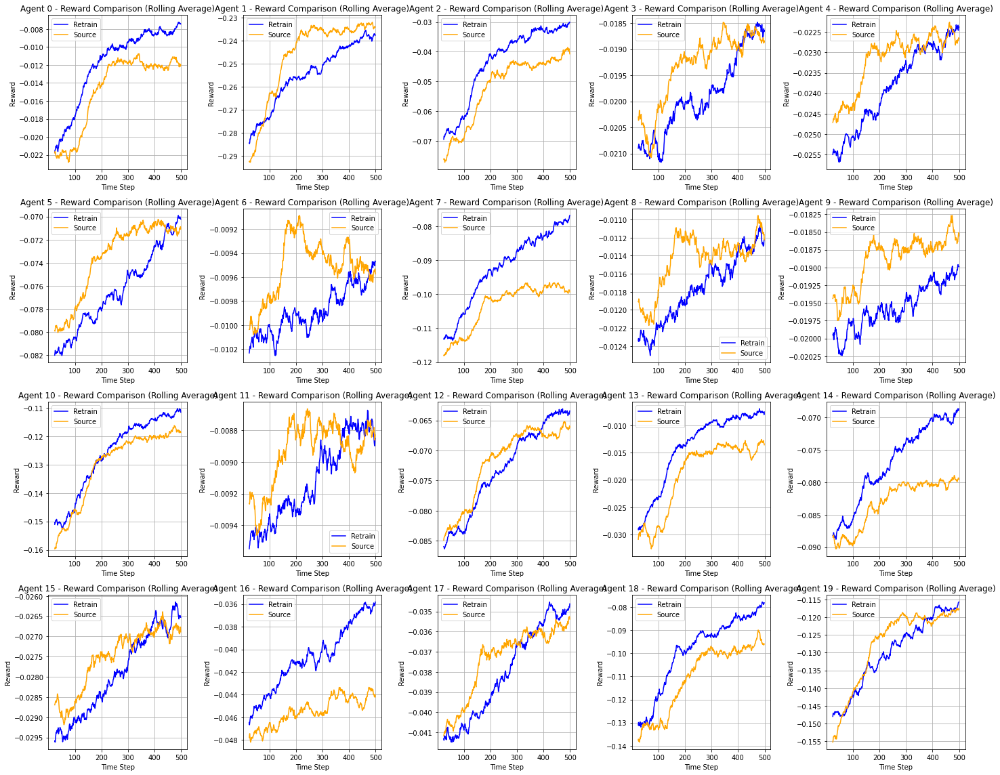

In [57]:
import os
import json
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path

# Load the data
experiment_id = "07_February_2025_17:55:14_BasicClubConvergence_20"
exp_path = Path(os.getcwd(), experiment_id)
files = os.listdir(exp_path)

# Separate retrain and source files
retrains = [file for file in files if "retrain" in file]
source = [file for file in files if "retrain" not in file][0]

# Load source data
with open(Path(exp_path, source), 'r') as f:
    source_data = json.load(f)

# Load target (retrained) data
target_logs = {}
for file in retrains:
    agent_id = int(file.split("_")[1].replace(".json", ""))
    with open(Path(exp_path, file), 'r') as f:
        target_data = json.load(f)
    target_logs[agent_id] = target_data

# Define the window size for rolling average
window_size = 25  

# Create a figure with a 4x5 grid of subplots
fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(20, 16))  # Adjust figsize to fit your needs
axs = axs.flatten()  # Flatten the 2D array of axes to easily index them

# Iterate through each agent and plot their data
for idx, agent_id in enumerate(target_logs.keys()):
    retrained_data = target_logs[agent_id]
    
    # Extract and process data based on metric (for simplicity, using 'reward' metric)
    retrain_data = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in retrained_data]
    source_data_ = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in source_data][:len(retrain_data)]
    
    # Convert to pandas Series for rolling average
    retrain_series = pd.Series(retrain_data).rolling(window=window_size).mean()
    source_series = pd.Series(source_data_).rolling(window=window_size).mean()
    
    # Create a square plot for each agent
    axs[idx].plot(retrain_series, label='Retrain', color='blue')
    axs[idx].plot(source_series, label='Source', color='orange')
    axs[idx].set_title(f'Agent {agent_id} - Reward Comparison (Rolling Average)')
    axs[idx].set_xlabel('Time Step')
    axs[idx].set_ylabel('Reward')
    axs[idx].legend()
    axs[idx].grid()

# Remove any empty subplots if there are fewer agents than subplots
for j in range(len(target_logs), len(axs)):
    fig.delaxes(axs[j])

# Adjust layout
plt.tight_layout()

# Create plots directory if it does not exist
plots_dir = Path(exp_path, "plots")
os.makedirs(plots_dir, exist_ok=True)

# Save the figure for the current metric
plt.savefig(plots_dir / 'reward_comparison_grid.png')
plt.show()


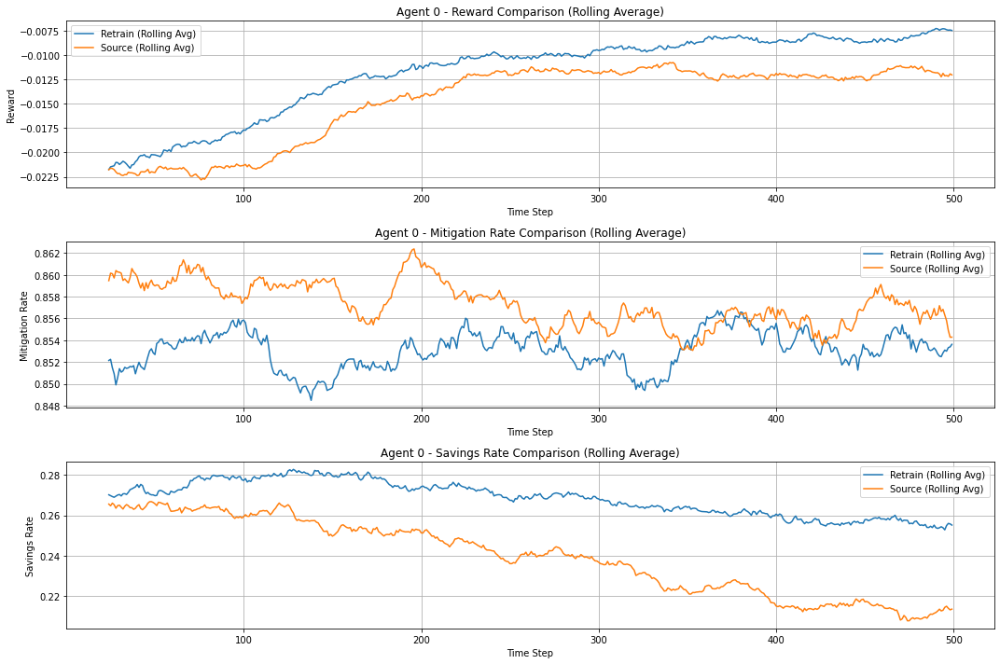

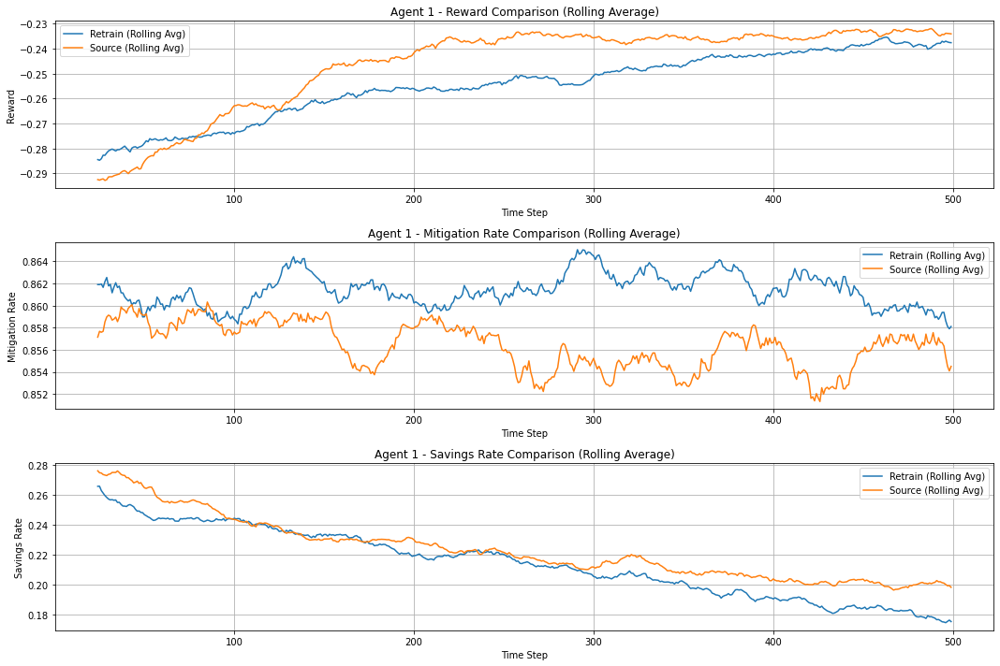

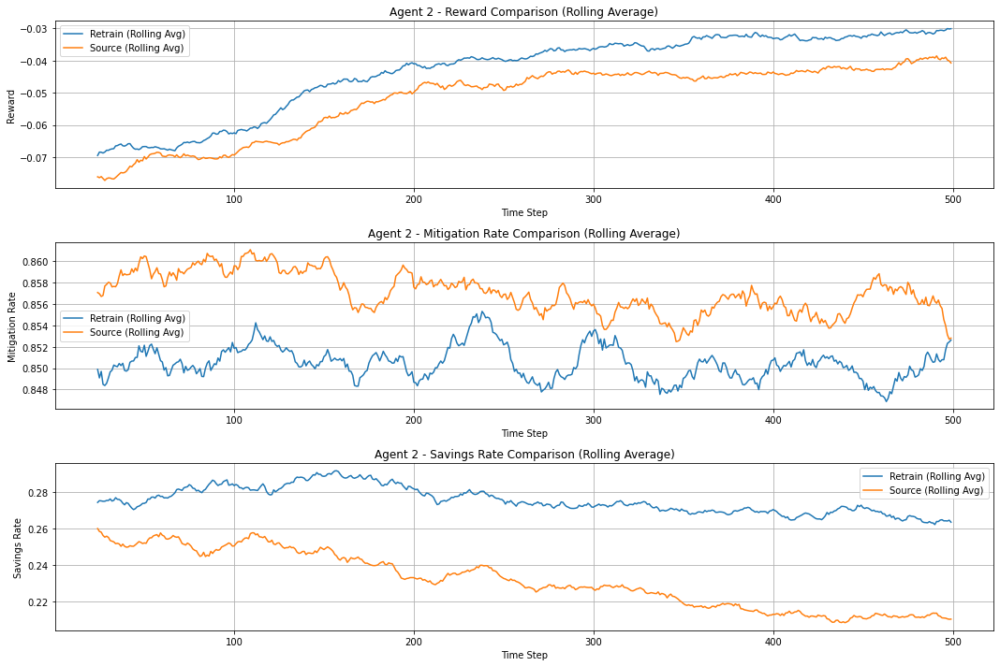

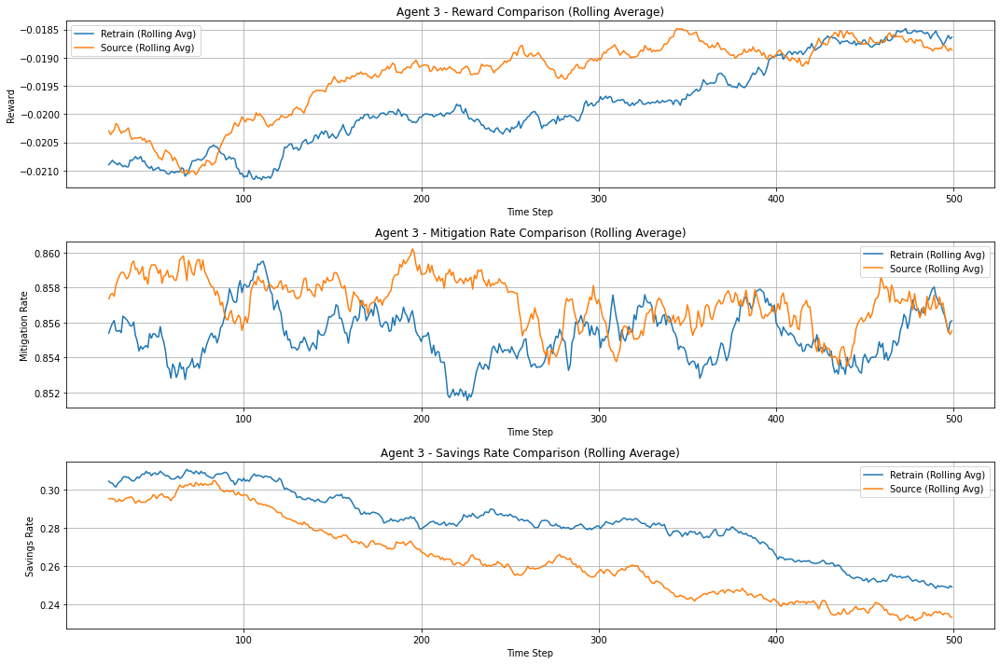

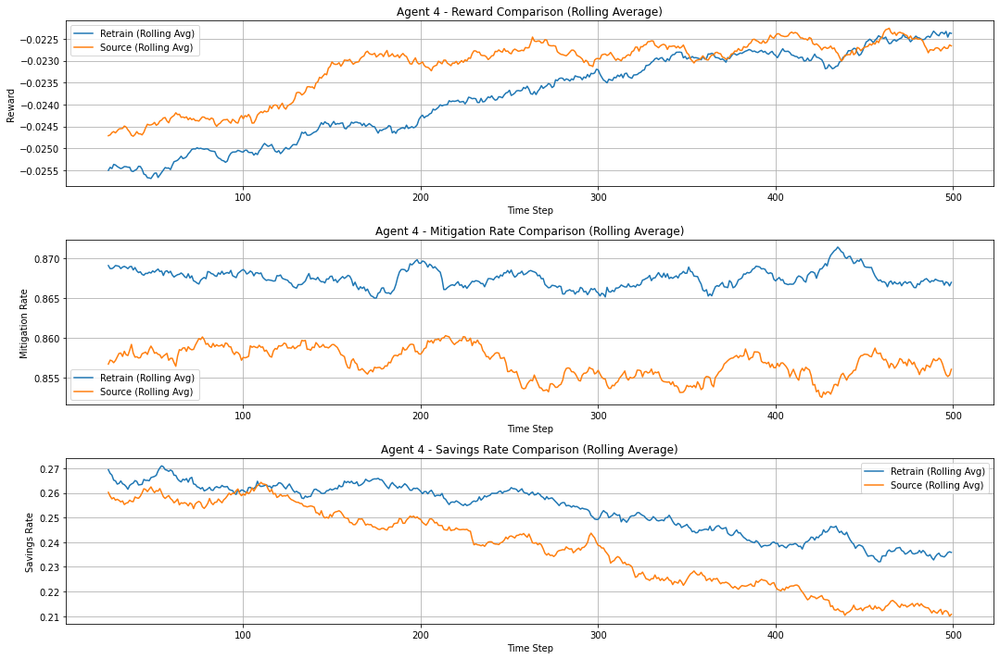

...

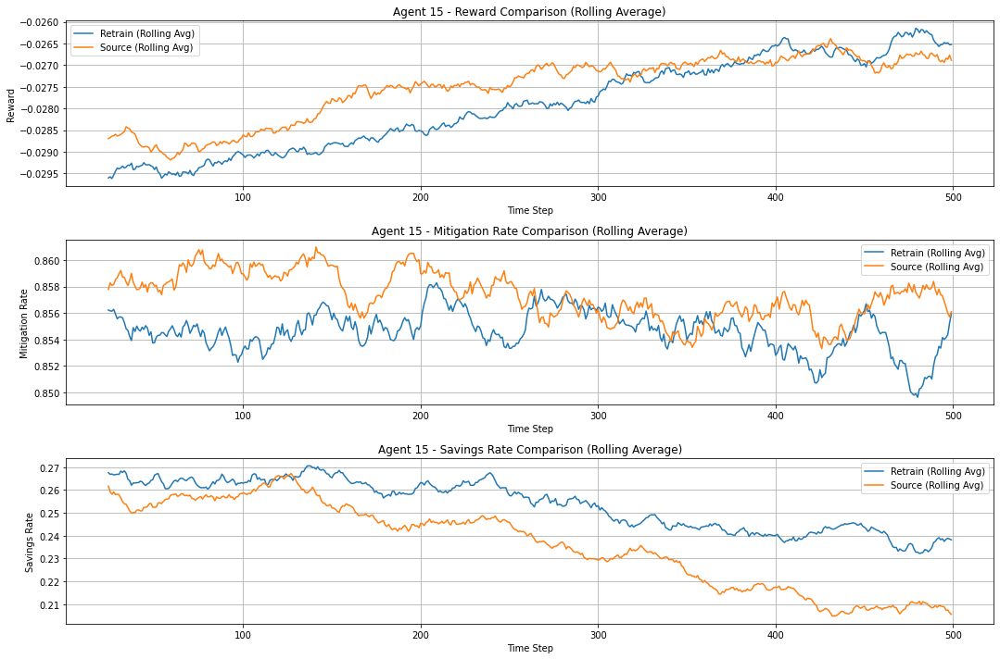

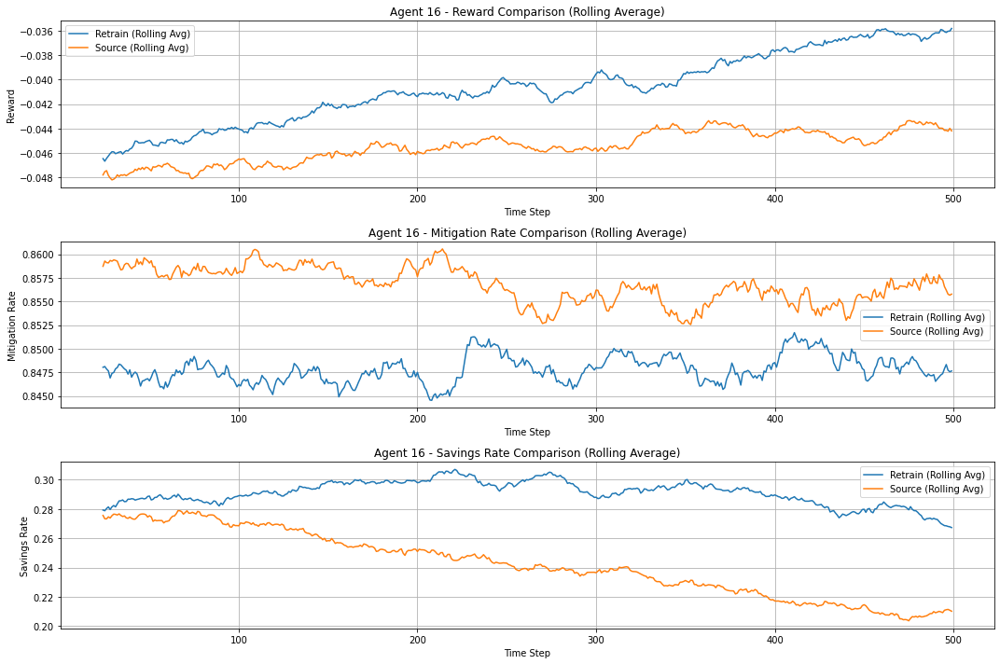

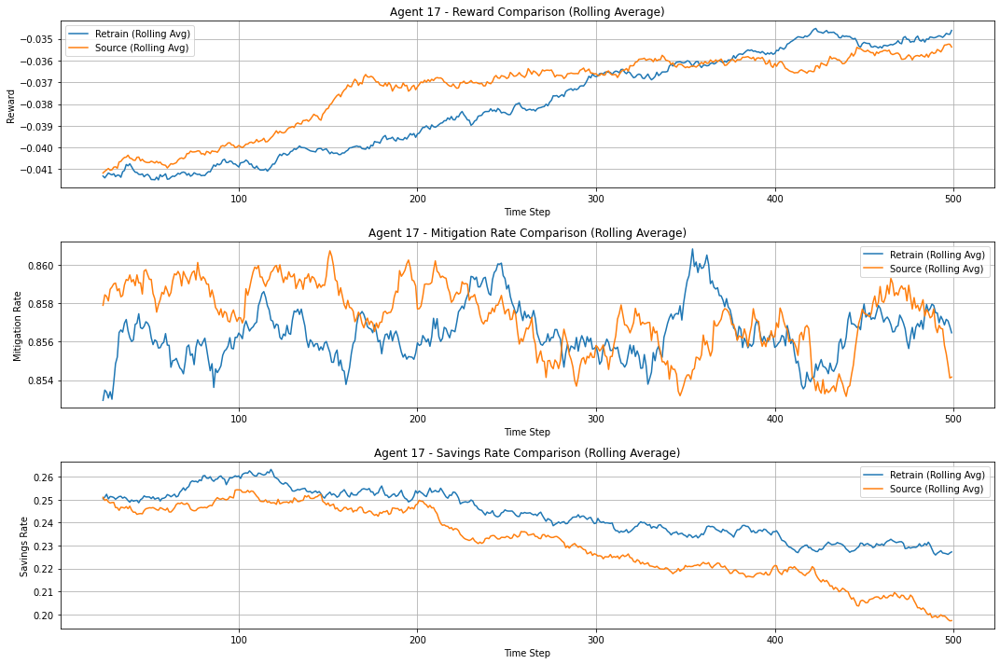

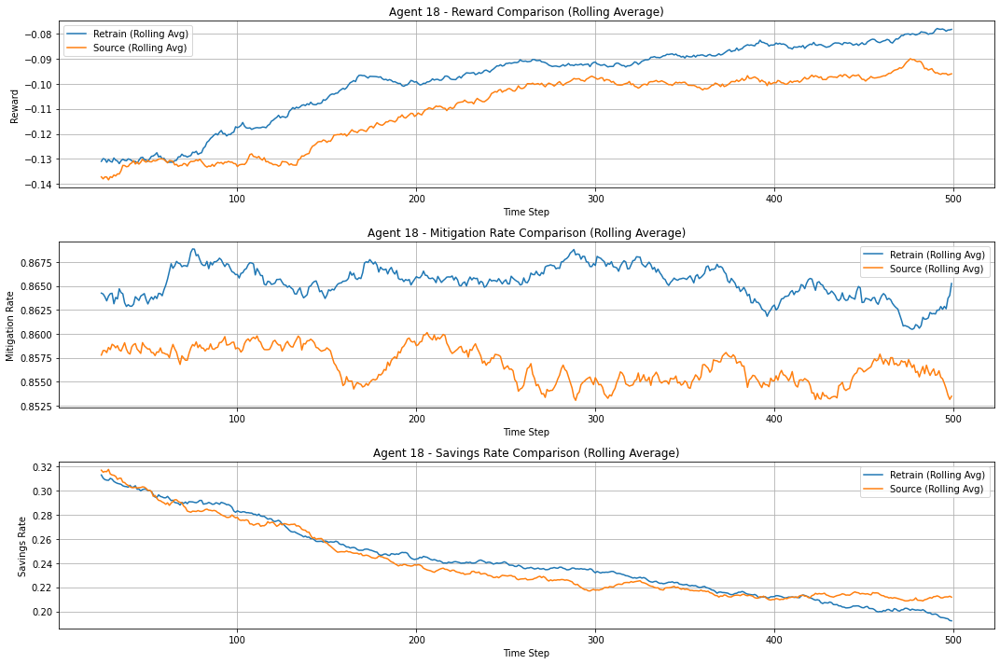

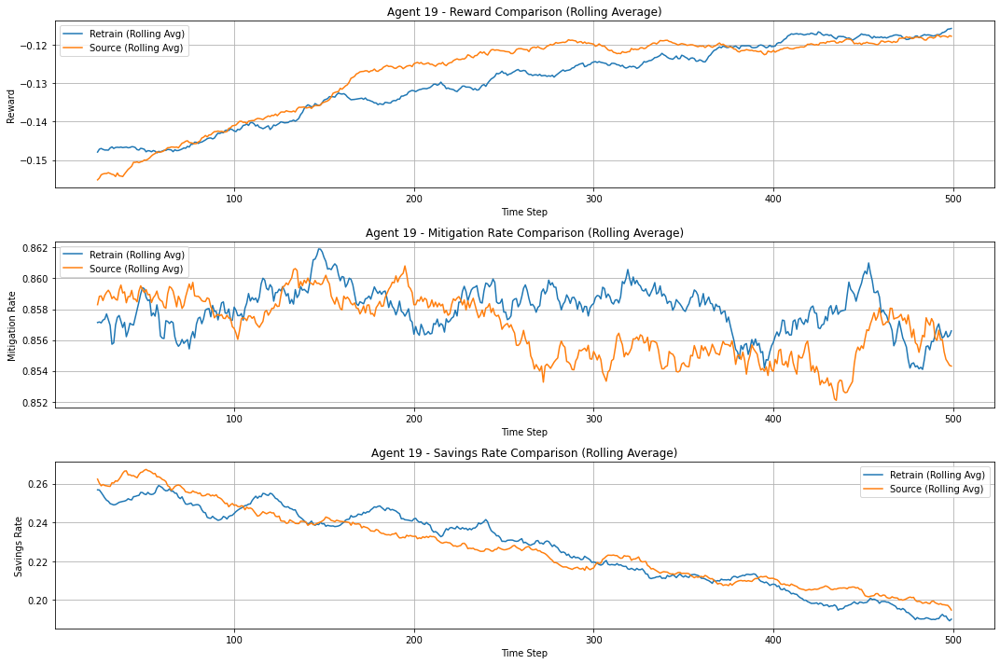

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming target_logs and source_data are already defined
window_size = 25  # Define the window size for the rolling average

for agent_id in target_logs.keys():
    retrained_data = target_logs[agent_id]
    
    # Extract data for retrained and source
    reward_retrain = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in retrained_data]
    reward_source = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

    mitigation_retrain = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in retrained_data]
    mitigation_source = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

    savings_retrain = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in retrained_data]
    savings_source = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

    # Convert to pandas Series for rolling average
    reward_retrain_series = pd.Series(reward_retrain).rolling(window=window_size).mean()
    reward_source_series = pd.Series(reward_source).rolling(window=window_size).mean()

    mitigation_retrain_series = pd.Series(mitigation_retrain).rolling(window=window_size).mean()
    mitigation_source_series = pd.Series(mitigation_source).rolling(window=window_size).mean()

    savings_retrain_series = pd.Series(savings_retrain).rolling(window=window_size).mean()
    savings_source_series = pd.Series(savings_source).rolling(window=window_size).mean()

    # Create a figure for the plots
    plt.figure(figsize=(15, 10))

    # Plot Reward
    plt.subplot(3, 1, 1)
    plt.plot(reward_retrain_series, label='Retrain')
    plt.plot(reward_source_series, label='Source')
    plt.title(f'Agent {agent_id} - Reward Comparison (Rolling Average)')
    plt.xlabel('Time Step')
    plt.ylabel('Reward')
    plt.legend()
    plt.grid()

    # Plot Mitigation Rate
    plt.subplot(3, 1, 2)
    plt.plot(mitigation_retrain_series, label='Retrain')
    plt.plot(mitigation_source_series, label='Source')
    plt.title(f'Agent {agent_id} - Mitigation Rate Comparison (Rolling Average)')
    plt.xlabel('Time Step')
    plt.ylabel('Mitigation Rate')
    plt.legend()
    plt.grid()

    # Plot Savings Rate
    plt.subplot(3, 1, 3)
    plt.plot(savings_retrain_series, label='Retrain')
    plt.plot(savings_source_series, label='Source')
    plt.title(f'Agent {agent_id} - Savings Rate Comparison (Rolling Average)')
    plt.xlabel('Time Step')
    plt.ylabel('Savings Rate')
    plt.legend()
    plt.grid()

    # Adjust layout
    plt.tight_layout()
    # Save the figure if needed

    os.makedirs(Path(exp_path, "plots"), exist_ok = True)
    
    plt.savefig(Path(exp_path, "plots",f'agent_{agent_id}_comparison_smoothing.png'))
    # Show the plots
    plt.show()


/home/ubuntu/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


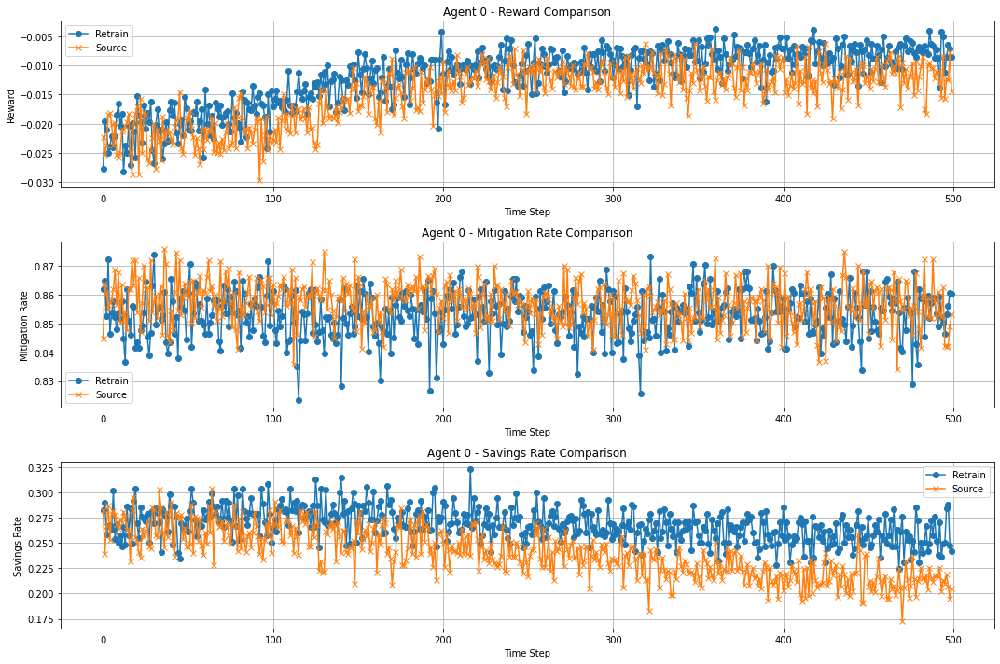

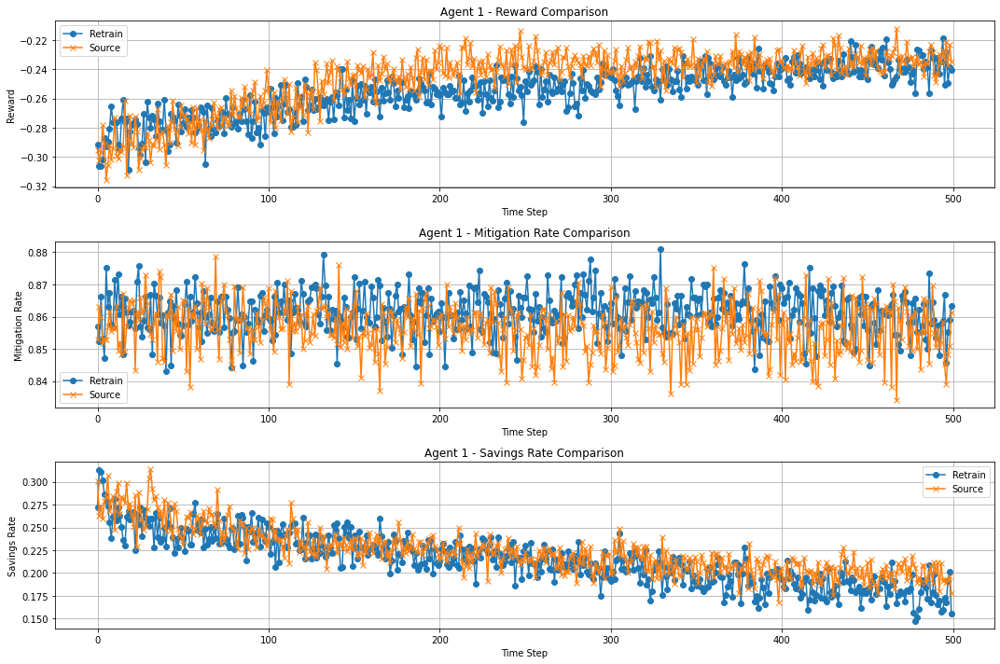

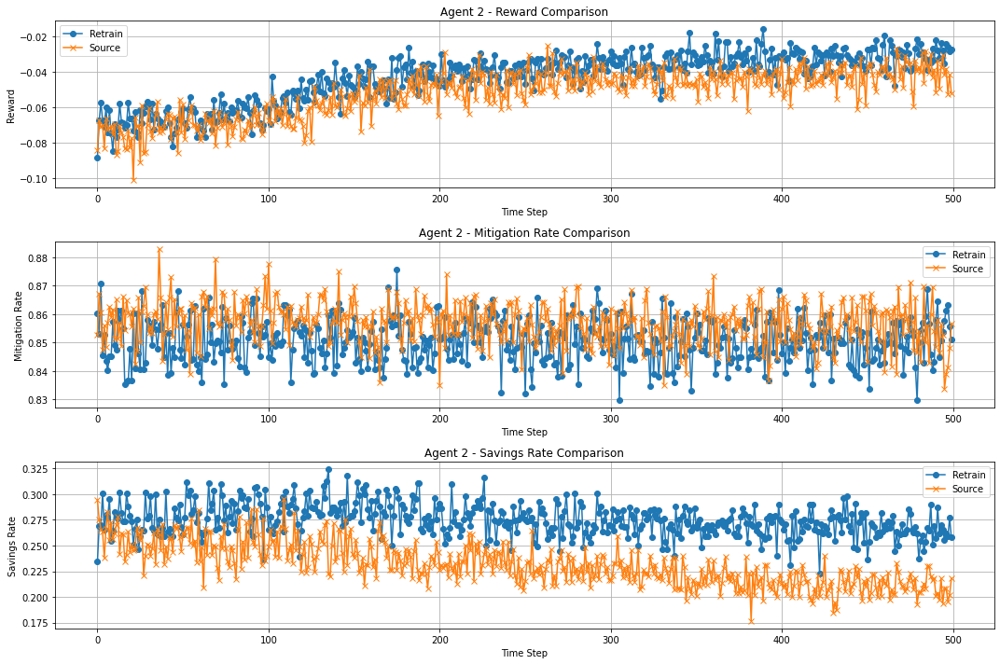

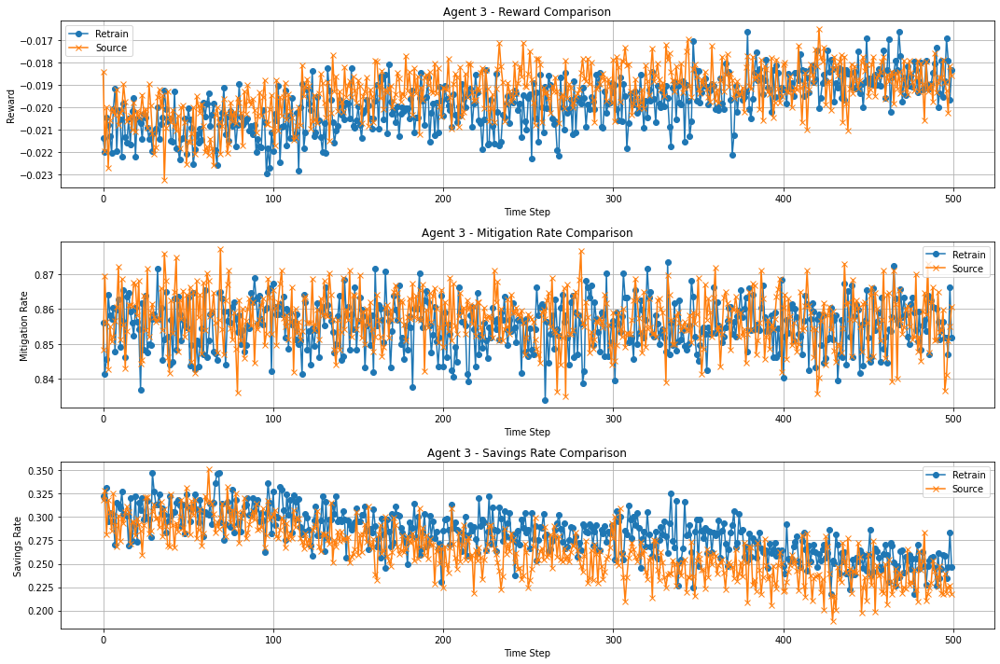

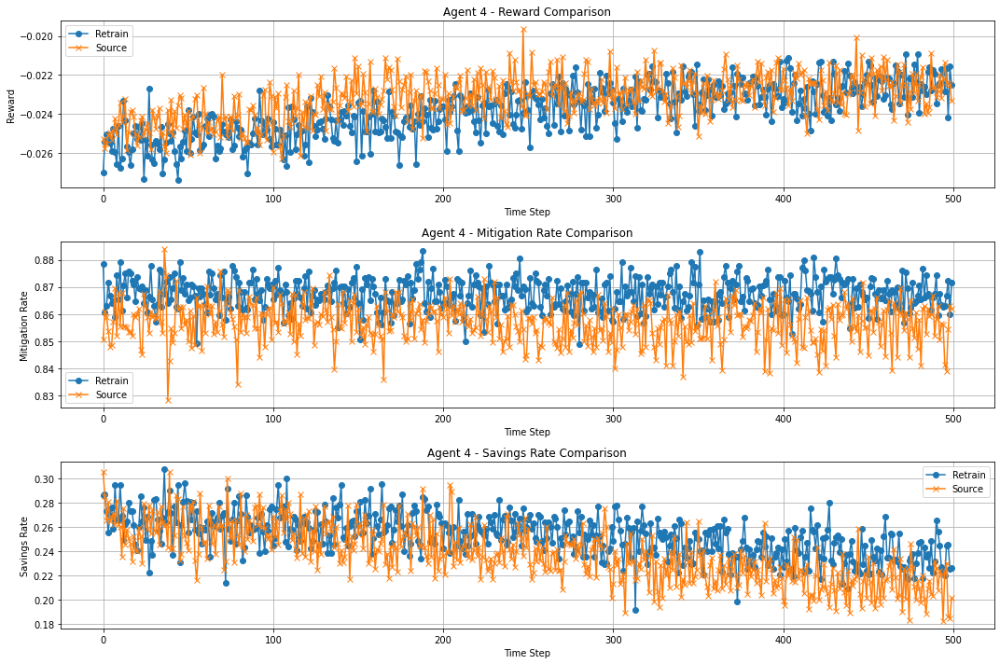

...

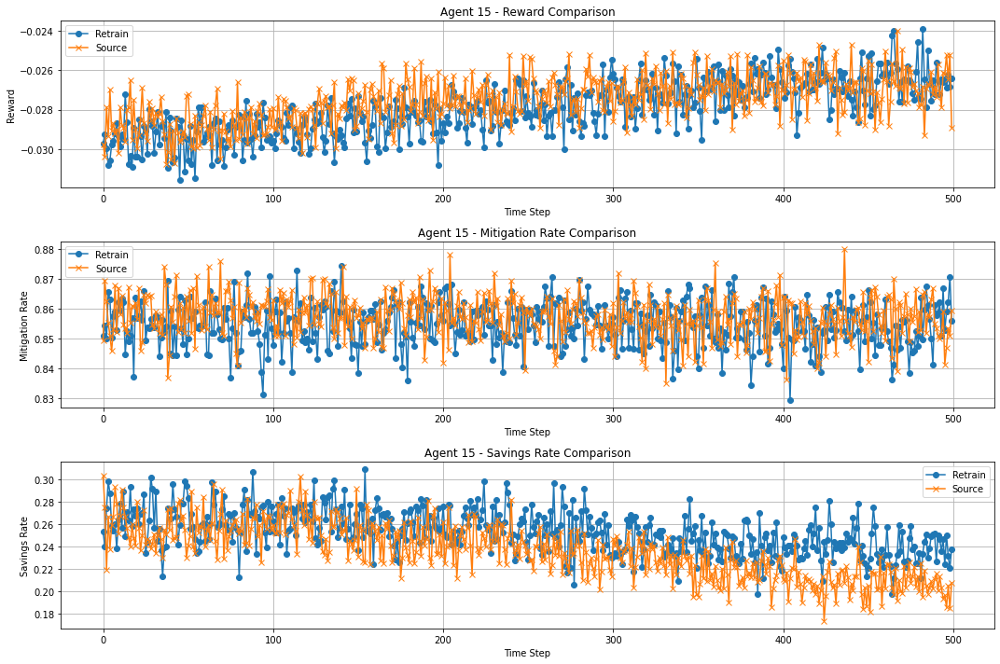

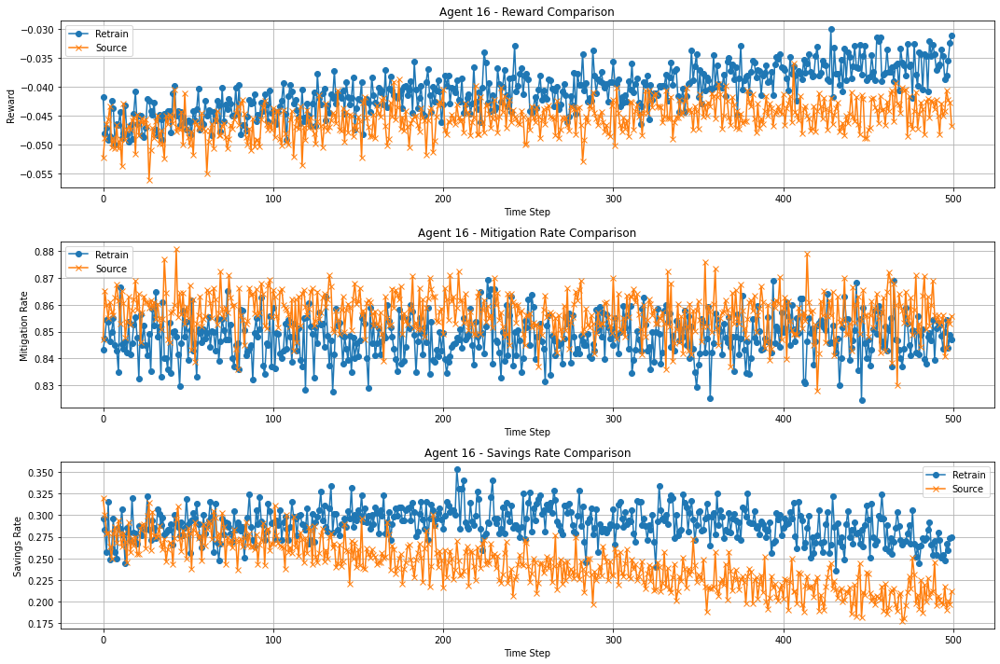

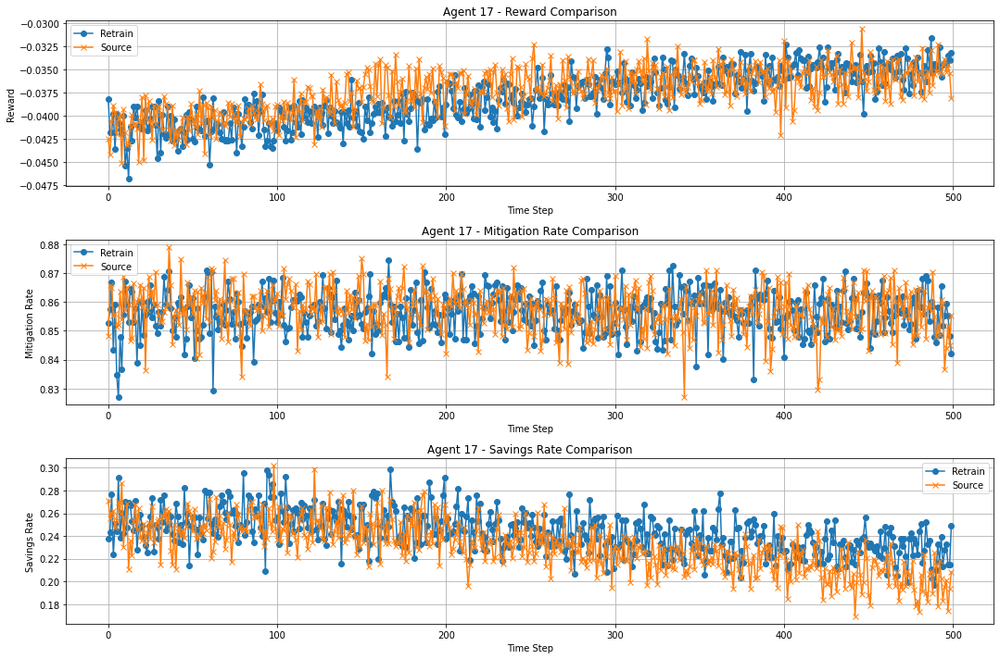

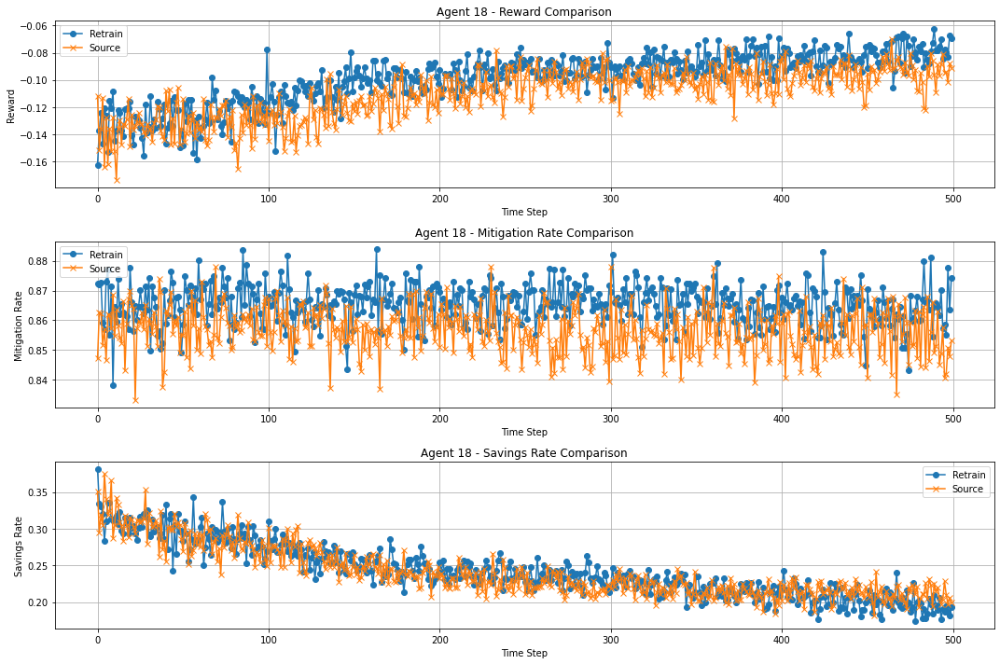

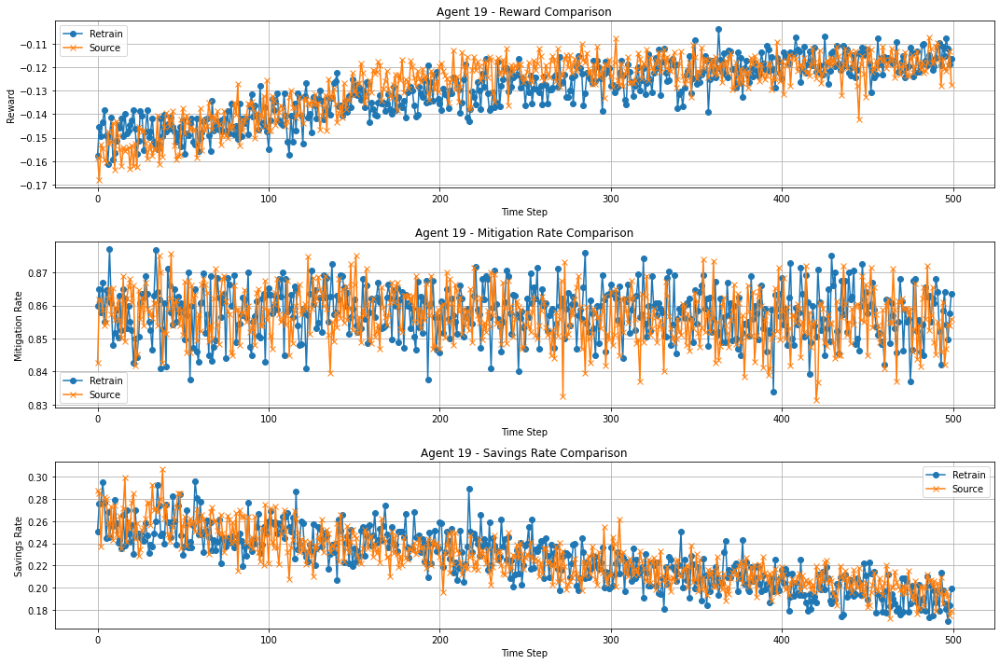

In [37]:
import matplotlib.pyplot as plt

# Assuming target_logs and source_data are already defined
for agent_id in target_logs.keys():
    retrained_data = target_logs[agent_id]
    
    # Extract data for retrained and source
    reward_retrain = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in retrained_data]
    reward_source = [d[f'reward_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

    mitigation_retrain = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in retrained_data]
    mitigation_source = [d[f'mitigation_rates_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

    savings_retrain = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in retrained_data]
    savings_source = [d[f'savings_all_regions_region_{agent_id}_mean'] for d in source_data][:len(reward_retrain)]

    # Create a figure for the plots
    plt.figure(figsize=(15, 10))

    # Plot Reward
    plt.subplot(3, 1, 1)
    plt.plot(reward_retrain, label='Retrain', marker='o')
    plt.plot(reward_source, label='Source', marker='x')
    plt.title(f'Agent {agent_id} - Reward Comparison')
    plt.xlabel('Time Step')
    plt.ylabel('Reward')
    plt.legend()
    plt.grid()

    # Plot Mitigation Rate
    plt.subplot(3, 1, 2)
    plt.plot(mitigation_retrain, label='Retrain', marker='o')
    plt.plot(mitigation_source, label='Source', marker='x')
    plt.title(f'Agent {agent_id} - Mitigation Rate Comparison')
    plt.xlabel('Time Step')
    plt.ylabel('Mitigation Rate')
    plt.legend()
    plt.grid()

    # Plot Savings Rate
    plt.subplot(3, 1, 3)
    plt.plot(savings_retrain, label='Retrain', marker='o')
    plt.plot(savings_source, label='Source', marker='x')
    plt.title(f'Agent {agent_id} - Savings Rate Comparison')
    plt.xlabel('Time Step')
    plt.ylabel('Savings Rate')
    plt.legend()
    plt.grid()

    # Adjust layout
    plt.tight_layout()
    # Save the figure if needed
    plt.savefig(f'agent_{agent_id}_comparison.png')
    # Show the plots
    plt.show()
